In [1]:
from pathlib import Path
import os
import cmcrameri.cm as cmc

COLOR_MAP = cmc.batlow
COLOR_MAP_NAME = 'cmc_batlows'

import dask
dask.config.set(scheduler='threads') 

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from datetime import datetime

In [3]:
plt.style.use('seaborn-v0_8-white')
#plt.style.use('classic')

custom_style = {
    'axes.grid': False,
    'axes.facecolor': 'white',
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.titlesize': 14,
    'axes.labelsize': 14,
    'xtick.labelsize': 13,
    'ytick.labelsize': 13,
    'lines.linewidth': 2,
    'legend.fontsize': 14,
    'xtick.major.bottom': True,
    'xtick.major.top': False,
    'xtick.major.size': 4,
    'xtick.major.width': 1.5,
    'ytick.major.right': False,
    'ytick.major.left': True,
    'ytick.major.size': 4,
    'ytick.major.width': 1.5
}

# Use the custom style sheet
plt.style.use(custom_style)

#plt.rcParams.keys()

In [4]:
from context import CL61_module as mCL61

In [5]:
februar_04 = mCL61.CL61Processor(folder_path='../Data_samples', specific_filename='cl61_20230204.nc')
june28 = mCL61.CL61Processor(folder_path='../Data_samples', specific_filename="cl61_20230628.nc")

- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False
load data from specific filne cl61_20230204.nc


Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !
- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False
load data from specific filne cl61_20230628.nc
Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


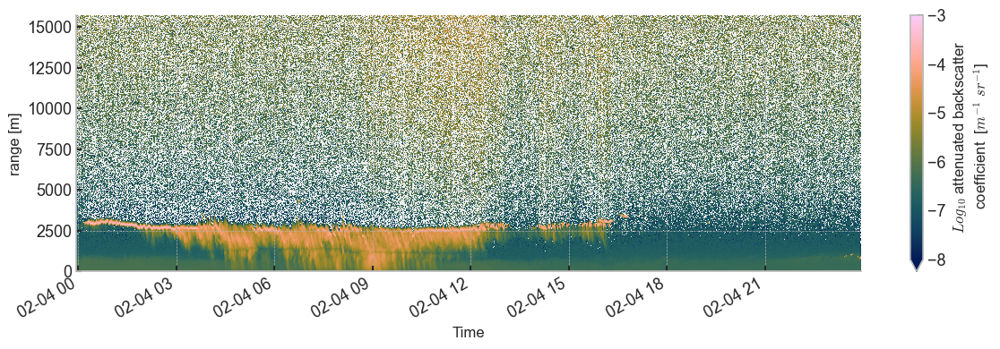

In [18]:
plt.figure(figsize=(12,4))
arr = np.log10(februar_04.dataset['beta_att'])
im = arr.plot.imshow(x = 'time', vmin = -8, vmax = -3,  cmap = cmc.batlow)

cbar = im.colorbar
cbar.set_label('$Log_{10}$ attenuated backscatter \n coefficient  [$m^{-1}~sr^{-1}$]')

plt.title("")
plt.ylabel('range [m]')
plt.tight_layout()
plt.savefig('beta_att.png', dpi = 400)
plt.show()

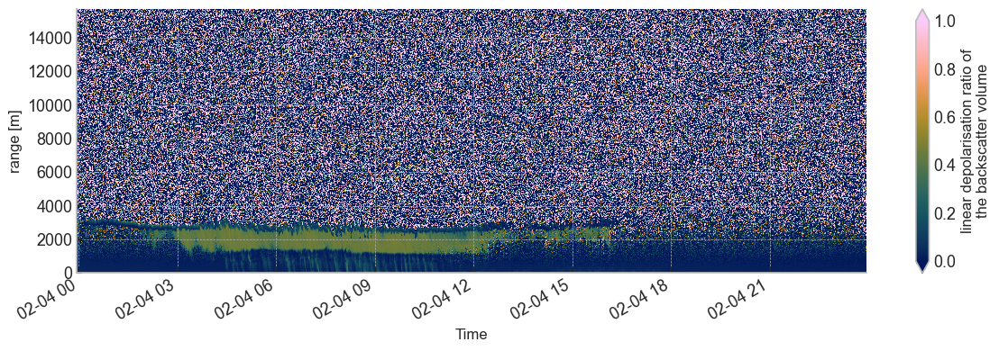

In [20]:
plt.figure(figsize=(12,4))

februar_04.dataset['linear_depol_ratio'].plot.imshow(x = 'time', vmin = 0, vmax = 1, cmap = cmc.batlow)

plt.title("")
plt.ylabel('range [m]')
plt.tight_layout()
plt.savefig('depol_ratio.png', dpi = 400)
plt.show()

c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


array([<Axes: xlabel='Time', ylabel='range [m]'>,
       <Axes: xlabel='Time', ylabel='range [m]'>], dtype=object)

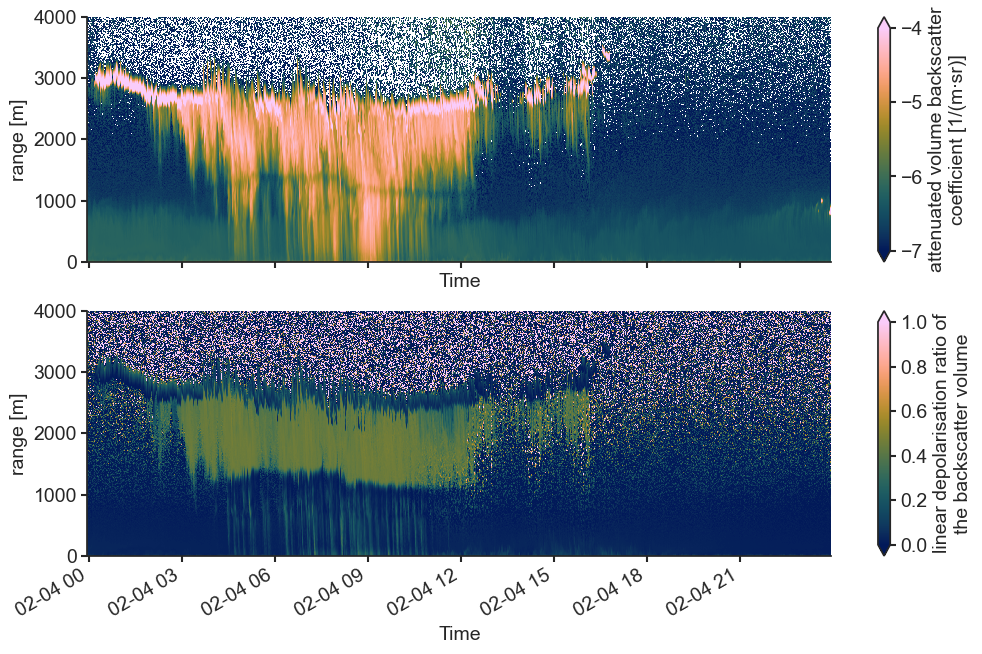

In [27]:
februar_04.plot.show_timeserie(range_limits=[0,4000])

# Preprocessing analysis

Text(0.5, 0, 'Range: Distance between two measure')

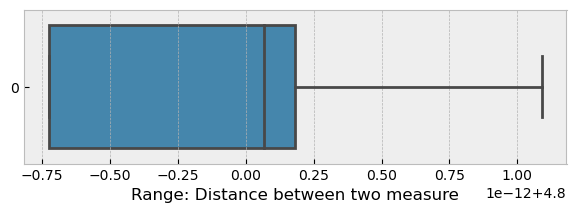

In [4]:
range_val = februar_04.dataset['range'].values
diff_range = range_val[1:]- range_val[:-1]
plt.figure(figsize=(7,2))
sns.boxplot(diff_range, orient='horizontal')
plt.xlabel('Range: Distance between two measure')
#plt.savefig('../Outputs/DistanceRangeSteps.jpg', dpi=200)

Text(0.5, 0, 'Range: Distance between two measure')

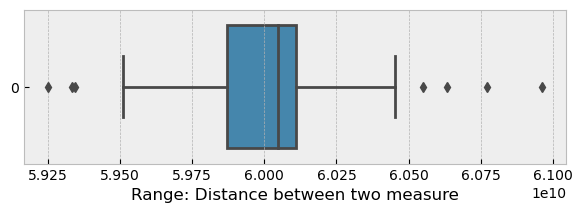

In [5]:
time_val = februar_04.dataset['time'].values
diff_time = time_val[1:]- time_val[:-1]
fig, ax = plt.subplots(1,1, figsize=(7,2))
sns.boxplot(diff_time, orient='horizontal', ax = ax)
xt = ax.get_xticks()
#ax.set_xticklabels(datetime(xt).seconds())
plt.xlabel('Range: Distance between two measure')
#plt.savefig('../Outputs/DistanceRangeSteps.jpg', dpi=200)

In [12]:
februar_04.dataset

<xarray.Dataset>
Dimensions:                            (time: 1440, layer: 5, range: 3276)
Coordinates:
  * time                               (time) datetime64[ns] 2023-02-03T23:57...
  * range                              (range) float64 0.0 4.8 ... 1.572e+04
  * layer                              (layer) float64 1.0 2.0 3.0 4.0 5.0
    longitude                          float64 ...
    latitude                           float64 ...
Data variables: (12/21)
    cloud_base_heights                 (time, layer) float64 ...
    vertical_visibility                (time) float64 ...
    p_pol                              (time, range) float32 ...
    x_pol                              (time, range) float32 ...
    beta_att                           (time, range) float32 2.007e-06 ... 8....
    linear_depol_ratio                 (time, range) float32 0.1223 ... -0.1736
    ...                                 ...
    beta_att_clean                     (time, range) float32 nan nan ... nan nan
    linear_depol_ratio_clean           (time, range) float32 nan nan ... nan nan
    noise_mask                         (time, range) bool False False ... False
    to_interpolate_mask                (time, range) bool False False ... False
    beta_att_roll_mean                 (time, range) float32 1.338e-06 ... -1...
    linear_depol_ratio_roll_mean       (time, range) float32 0.07804 ... -0.3062
Attributes:
    title:                                         CL61D, CL61 with Depolariz...
    institution:                                   
    source:                                        CL61EERL
    conventions:                                   CF-1.8
    schema_version:                                1.2
    sw_version:                                    1.1.10
    history:                                       
    comment:                                       
    unit:                                          m
    temporal span of this file in minutes:         5.0
    time between consecutive profiles in seconds:  60

# 1) Noise processing

In the noise processing, the final approach is implemented in the process.mask_noise() method but other methods are also tested.

### i) Main noise processing

The final method is basically:
- Checking if a value inside a rolling windows is noise (outside of expected range)
- Keeping only full valid windows

In [5]:
februar_04.process_noise.mask_noise()

The results are stored under new variable: beta_att_clean, linear_depol_ratio_clean, noise mask and to_interpolate_mask


## ii) Compare with mean and median 

In [5]:
februar_04.process_noise.rolling_window_stats(stat = 'mean', variable_name='beta_att', time_window_size=10, range_window_size=10)
februar_04.process_noise.rolling_window_stats(stat = 'mean', variable_name='linear_depol_ratio', time_window_size=10, range_window_size=10)
None
# 10x10 takes only 10s
# 30x15 takes around 1min

Saved the result as variable : beta_att_roll_mean
Saved the result as variable : linear_depol_ratio_roll_mean


In [6]:
februar_04.process_noise.rolling_window_stats(stat = 'median', variable_name='beta_att', time_window_size=10, range_window_size=10)
februar_04.process_noise.rolling_window_stats(stat = 'median', variable_name='linear_depol_ratio', time_window_size=10, range_window_size=10)
# 7x7 takes around 2 minutes
# 10x10 takes around 7 minutes already

Saved the result as variable : beta_att_roll_median
Saved the result as variable : linear_depol_ratio_roll_median


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to ..\Outputs\feb04_rollmean_10x10_8000m.jpg


array([<Axes: xlabel='Time', ylabel='range [m]'>,
       <Axes: xlabel='Time', ylabel='range [m]'>], dtype=object)

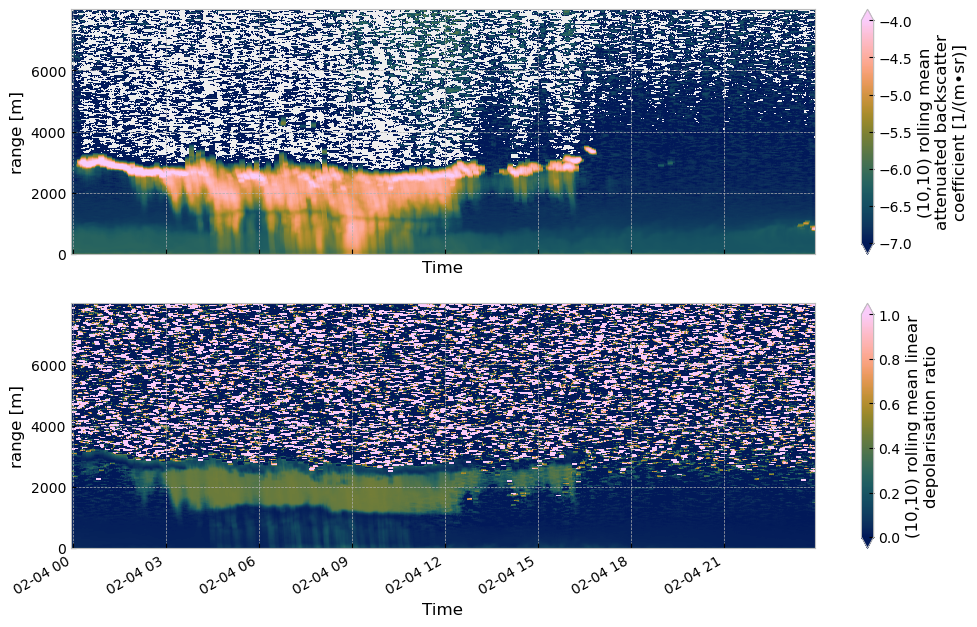

In [7]:
# save_fig='feb04_rol_mean_15x10.jpg'
februar_04.plot.show_timeserie(variable_names=['beta_att_roll_mean', 'linear_depol_ratio_roll_mean'],
                           range_limits=[0,8000], save_fig = 'feb04_rollmean_10x10_8000m.jpg')

c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to ..\Outputs\feb04_rol_median_10x10_8000m.jpg


array([<Axes: xlabel='Time', ylabel='range [m]'>,
       <Axes: xlabel='Time', ylabel='range [m]'>], dtype=object)

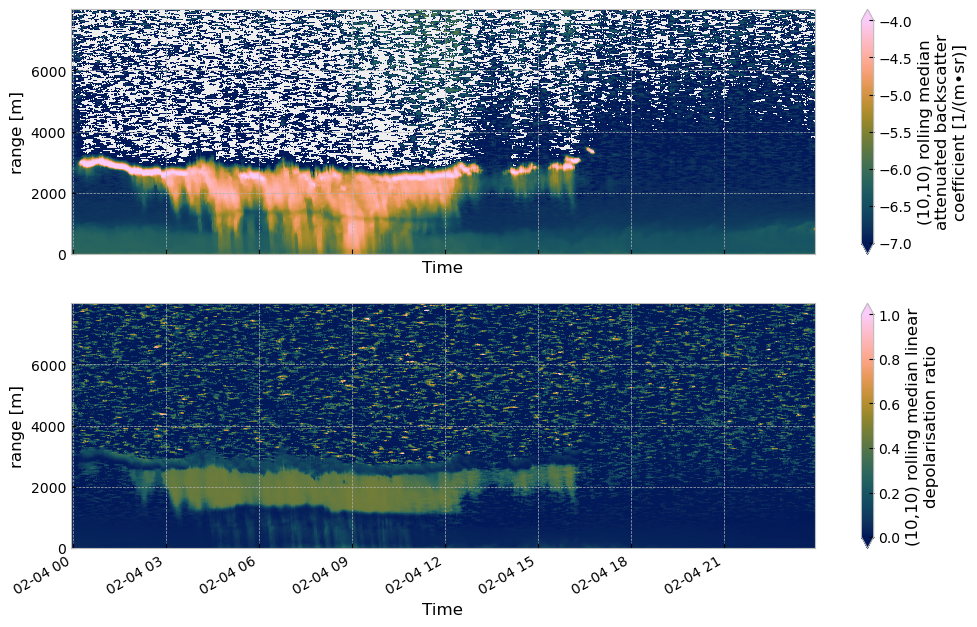

In [8]:
februar_04.plot.show_timeserie(variable_names=['beta_att_roll_median', 'linear_depol_ratio_roll_median'],
                          range_limits=[0,8000], save_fig='feb04_rol_median_10x10_8000m.jpg')

In [ ]:
#COLORMAPS
arr_cmap = ["#03275C", "#000000", "#1C6061", "#CC933C", "#FCBAC4"]
obj_cmap = {"Royal blue (traditional)":"03275C","Black":"000000","Caribbean Current":"1C6061","Harvest gold":"CC933C","Pink":"FCBAC4"}

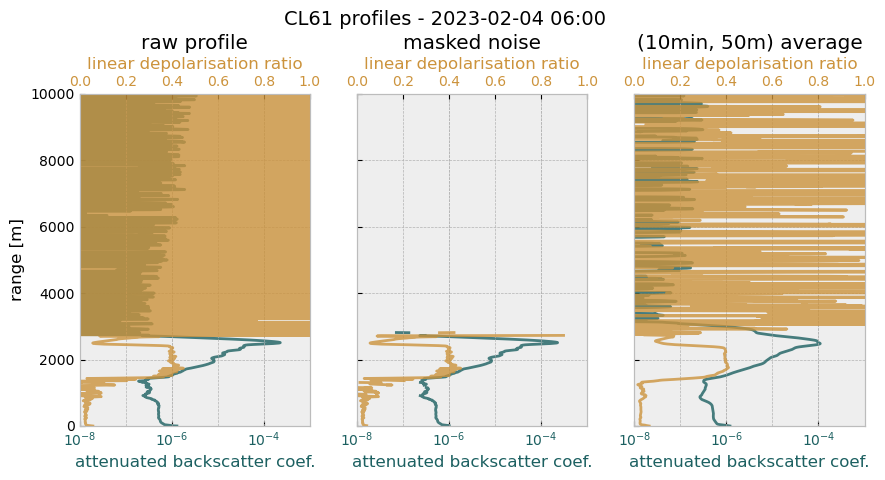

In [23]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1,3, figsize = (9,5), sharey=True)
range_of_interest = [0,10000]
axs[0], axs02 = februar_04.plot.vertical_profile(time_period='2023-02-04 06:00', var_names=['beta_att', 'linear_depol_ratio'],
                                                    var_xlims=[[1e-8, 1e-3], [0,1]],
                                                    xlabel1='attenuated backscatter coef.',
                                                    xlabel2= 'linear depolarisation ratio',
                                                    fig = fig, ax = axs[0],
                                                    range_limits = range_of_interest,
                                                    plot_colors=["#1C6061","#CC933C"],
                                                    title = 'raw profile')

februar_04.plot.vertical_profile(time_period='2023-02-04 06:00', var_names=['beta_att_clean', 'linear_depol_ratio_clean'],
                                 var_xlims=[[1e-8, 1e-3], [0,1]],
                                 xlabel1='attenuated backscatter coef.',
                                 xlabel2= 'linear depolarisation ratio',
                                 fig = fig, ax = axs[1],
                                 range_limits = range_of_interest,
                                 plot_colors=["#1C6061","#CC933C"],
                                 title = 'masked noise')
axs[1].set_ylabel(None)
februar_04.plot.vertical_profile(time_period='2023-02-04 06:00', var_names=['beta_att_roll_mean', 'linear_depol_ratio_roll_mean'],
                                 var_xlims=[[1e-8, 1e-3], [0,1]],
                                 xlabel1='attenuated backscatter coef.',
                                 xlabel2= 'linear depolarisation ratio',
                                 fig = fig, ax = axs[2],
                                 range_limits = range_of_interest,
                                 plot_colors=["#1C6061","#CC933C"],
                                 title = '(10min, 50m) average')
axs[2].set_ylabel(None)

plt.suptitle('CL61 profiles - 2023-02-04 06:00', y = 0.95, fontsize = 14)
plt.tight_layout()
plt.savefig("../Outputs/feb04_06h_compare_profiles_10000.jpg", dpi=300)
plt.show()

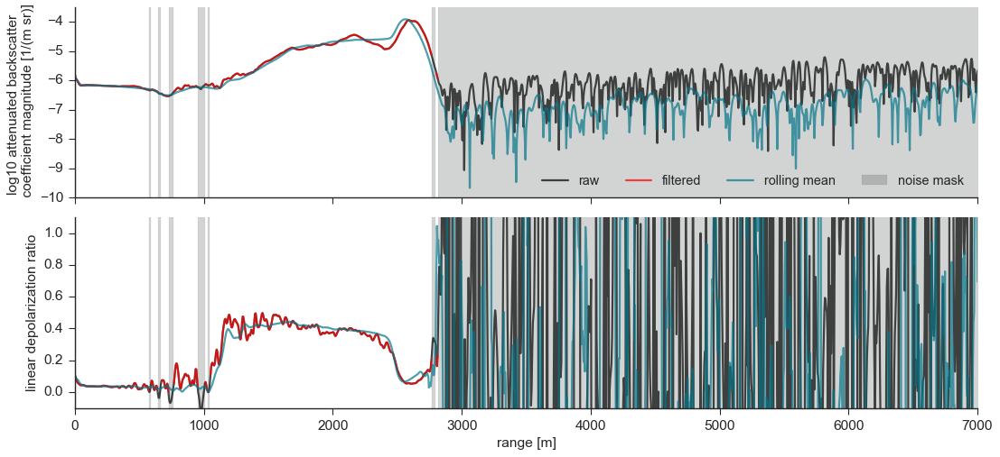

In [206]:
fig, axs = plt.subplots(2, 1, figsize=(14, 6.5), sharex=True)

time_of_interest = '2023-02-04 12:00'
red = '#922b21'
green = '#468407'
blue  = '#047589'
orange = '#e08e23'
fill_clr = '#4c5253'

# Backscatter
a1 = np.log10(np.abs(februar_04.dataset['beta_att'].sel(time=time_of_interest, range=slice(0, 8000)))).plot(ax=axs[0], alpha=0.7, color='black')
a2 = np.log10(februar_04.dataset['beta_att_clean'].sel(time=time_of_interest, range=slice(0, 8000))).plot(ax=axs[0], alpha=0.7, color='red')
a3 = np.log10(np.abs(februar_04.dataset['beta_att_roll_mean'].sel(time=time_of_interest, range=slice(0, 8000)))).plot(ax=axs[0], linewidth=2, alpha=0.7, color=blue)
#a4 = np.log10(np.abs(februar_04.dataset['beta_att_roll_median'].sel(time=time_of_interest, range=slice(0, 8000)))).plot(ax=axs[0], alpha=0.7, color=blue)

# Fill between x-values where beta_att_clean is NaN
beta_att_clean = februar_04.dataset['beta_att_clean'].sel(time=time_of_interest, range=slice(0, 8000))
nan_mask = np.isnan(beta_att_clean).to_dict()['data'][0]

axs[0].set_ylim([-10, -3.5])
axs[0].set_xlabel("")
axs[0].tick_params(axis='y', which='major', labelsize=14)
axs[0].set_ylabel('log10 attenuated backscatter \n coefficient magnitude [1/(m sr)]', fontsize=14)
#axs[0].set_title(f"CL61 profiles - {time_of_interest}", fontsize=14)
axs[0].set_title("")
axs[0].spines['top'].set_visible(False)
axs[0].spines['right'].set_visible(False)


# Identify consecutive ranges where beta_att_clean is NaN
consecutive_ranges = []
start_range = None

for i, is_nan in enumerate(nan_mask):
    if is_nan:
        if start_range is None:
            start_range = i
    elif start_range is not None:
        consecutive_ranges.append((start_range, i - 1))
        start_range = None
if start_range is not None:
    consecutive_ranges.append((start_range, i - 1))

# Fill between consecutive NaN ranges
for start, end in consecutive_ranges:
    axs[0].fill_betweenx(y=np.arange(-12, -2), x1=beta_att_clean['range'][start], x2=beta_att_clean['range'][end], color=fill_clr, alpha=0.25)
    axs[1].fill_betweenx(y=[-0.1, 1.1], x1=beta_att_clean['range'][start], x2=beta_att_clean['range'][end], color=fill_clr, alpha=0.25)

# LDR
februar_04.dataset['linear_depol_ratio'].sel(time=time_of_interest, range=slice(0, 8000)).plot(ax=axs[1], alpha=0.7, color='black')
februar_04.dataset['linear_depol_ratio_clean'].sel(time=time_of_interest, range=slice(0, 8000)).plot(ax=axs[1], alpha=0.7, color='red')
februar_04.dataset['linear_depol_ratio_roll_mean'].sel(time=time_of_interest, range=slice(0, 8000)).plot(ax=axs[1], alpha=0.7, linewidth=2, color=blue)
#februar_04.dataset['linear_depol_ratio_roll_median'].sel(time=time_of_interest, range=slice(0, 8000)).plot(ax=axs[1], alpha=0.8, color=blue)

axs[1].set_ylim([-0.1, 1.1])
axs[1].tick_params(axis='both', which='major', labelsize=14)
axs[1].set_ylabel('linear depolarization ratio', fontsize=14)
axs[1].set_xlabel('range [m]', fontsize=14)
axs[1].set_title("")
axs[1].spines['top'].set_visible(False)
axs[1].spines['right'].set_visible(False)

for ax in axs:
    ax.tick_params(axis='both', which='major', direction='out', length=6, width=1, top=False, right=False)

# Set legend between the two axes in a line
fig.legend(['raw', 'filtered', 'rolling mean', 'noise mask'], fontsize=13, ncol = 4,  bbox_to_anchor=(0.97, 0.64))

plt.xlim([0, 7000])

plt.tight_layout()

plt.savefig('Denoising_comp.png', dpi = 400)

plt.show()

(-9.0, -3.5)

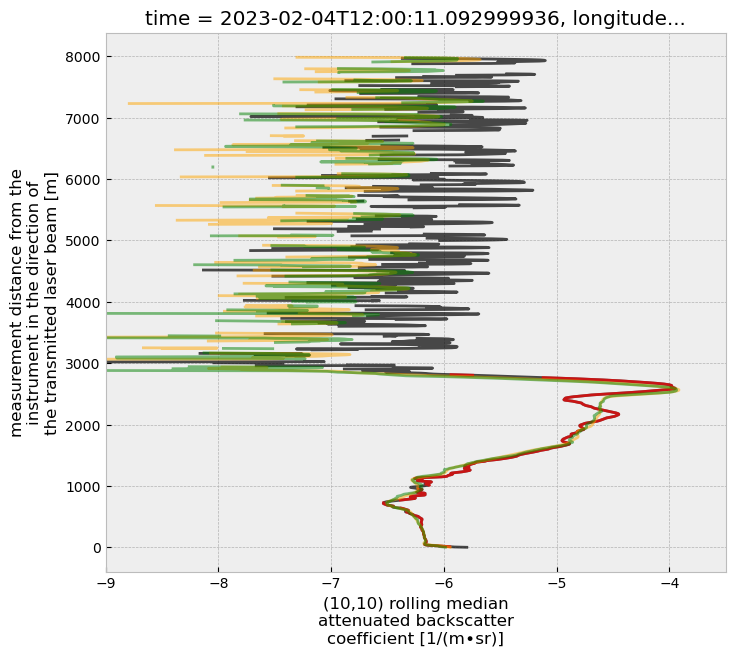

In [45]:
plt.figure(figsize=(8,7))
np.log10(februar_04.dataset['beta_att'].sel(time='2023-02-04 12:00', range=slice(0,8000))).plot(y='range', alpha = 0.7, color = 'black')
np.log10(februar_04.dataset['beta_att_clean'].sel(time='2023-02-04 12:00', range=slice(0,8000))).plot(y='range', alpha = 0.7, color = 'red')
np.log10(februar_04.dataset['beta_att_roll_mean'].sel(time='2023-02-04 12:00', range=slice(0,8000))).plot(y='range', alpha = 0.5, color = 'orange')
np.log10(februar_04.dataset['beta_att_roll_median'].sel(time='2023-02-04 12:00', range=slice(0,8000))).plot(y='range', alpha = 0.5, color = 'green')
plt.xlim([-9, -3.5])

### iv) We could try mean or median filtering on the direct measures

In [141]:
# 15x10 = 15minutes x 50 m
window = (15,10)
februar_04.process_noise.rolling_window_stats(stat = 'mean', variable_name='x_pol', time_window_size=window[0], range_window_size=window[1])
februar_04.process_noise.rolling_window_stats(stat = 'mean', variable_name='p_pol', time_window_size=window[0], range_window_size=window[1])

Saved the result as variable : x_pol_roll_mean
Saved the result as variable : p_pol_roll_mean


In [143]:
februar_04.dataset['beta_att_new'] = februar_04.dataset['p_pol_roll_mean'] + februar_04.dataset['x_pol_roll_mean']
februar_04.dataset['beta_att_new'].attrs['long_name'] = 'sum of mean polarisations'
februar_04.dataset['linear_depol_ratio_new'] = februar_04.dataset['x_pol_roll_mean'] / februar_04.dataset['p_pol_roll_mean']
februar_04.dataset['linear_depol_ratio_new'].attrs['long_name'] = 'mean polarisations ratio'

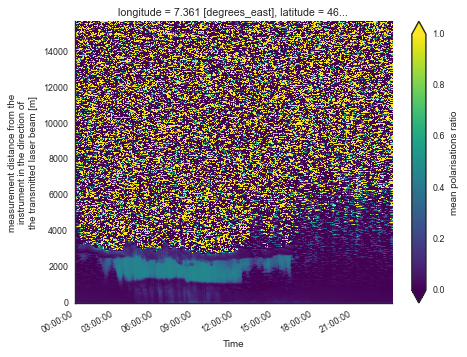

In [149]:
plt.figsize()
februar_04.dataset['linear_depol_ratio_new'].T.plot.imshow(vmin=0, vmax = 1)

(500.0, 4000.0)

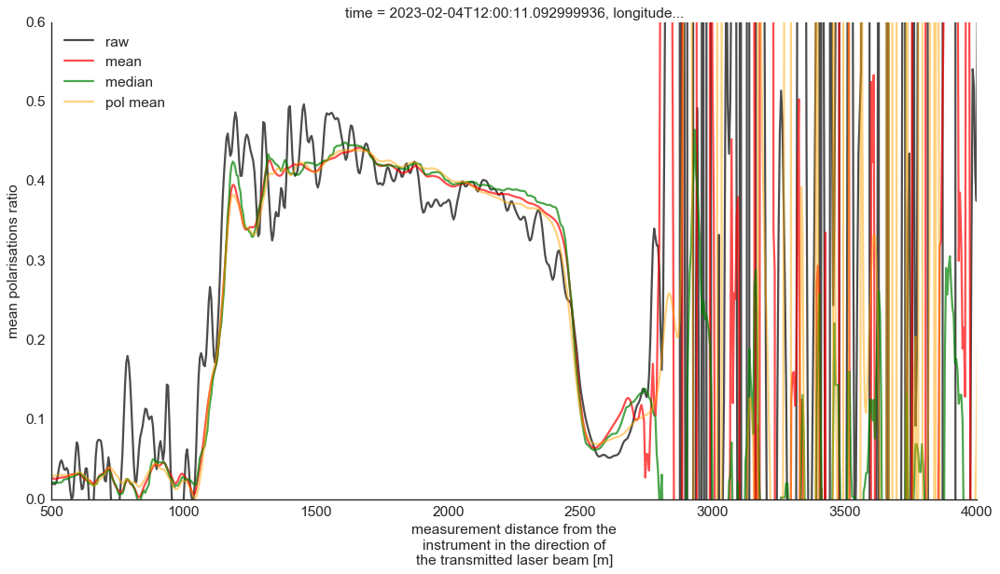

In [175]:
plt.figure(figsize=(16,8))
februar_04.dataset['linear_depol_ratio'].sel(time='2023-02-04 12:00', range=slice(0,8000)).plot(alpha = 0.7, color = 'black')
februar_04.dataset['linear_depol_ratio_roll_mean'].sel(time='2023-02-04 12:00', range=slice(0,8000)).plot(alpha = 0.7, color = 'red')
februar_04.dataset['linear_depol_ratio_roll_median'].sel(time='2023-02-04 12:00', range=slice(0,8000)).plot(alpha = 0.7, color = 'green')
februar_04.dataset['linear_depol_ratio_new'].sel(time='2023-02-04 12:00', range=slice(0,8000)).plot(alpha = 0.5, color = 'orange')
plt.legend(['raw', 'mean', 'median','pol mean'], loc = 'upper left')
plt.ylim([0, 0.6])
plt.xlim([500, 4000])

# 2) Clustering

Text(0.5, 33.26562500000004, '$log_{10}$ filtered attenuated backscatter [$m^{-1}~sr^{-1}$]')

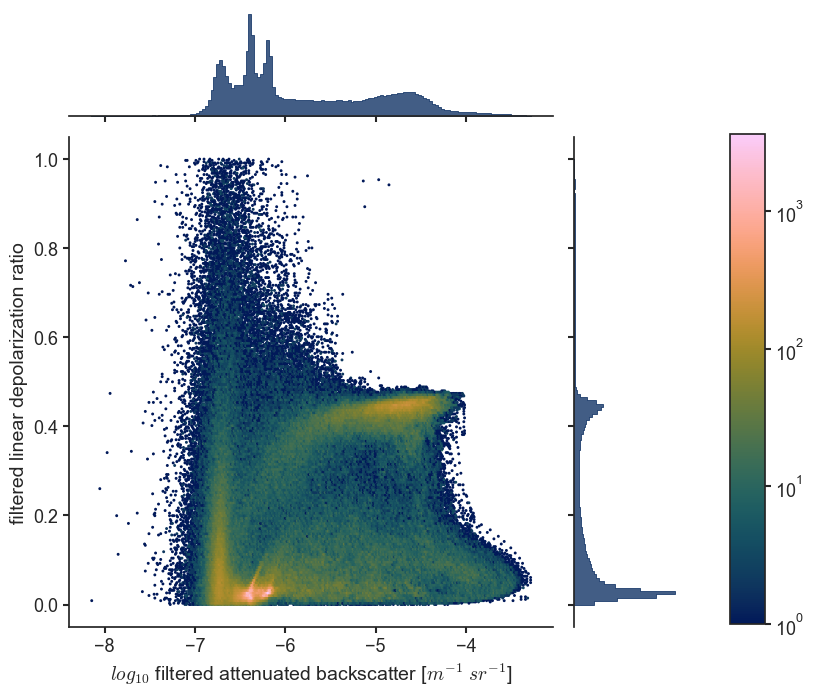

In [10]:
g = februar_04.plot.histogram_2d()
g.ax_joint.set_ylabel('filtered linear depolarization ratio')
g.ax_joint.set_xlabel('$log_{10}$ filtered attenuated backscatter [$m^{-1}~sr^{-1}$]')

In [12]:
import pandas as pd

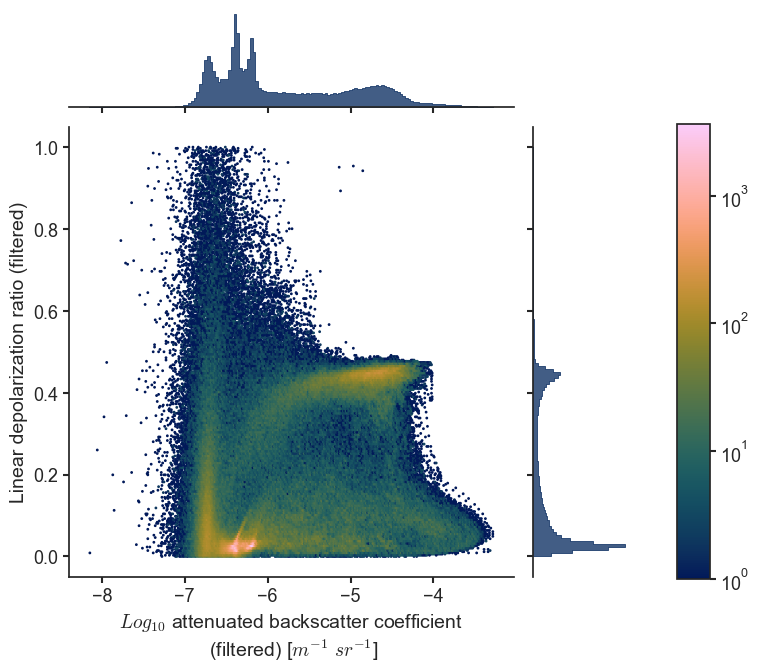

In [14]:
# Dataset reference and validity check
dataset = februar_04.dataset

variable_1 = 'beta_att_clean'
variable_2 = 'linear_depol_ratio_clean'

# Flatten values for binning (histograms)
x = dataset[variable_1].values.flatten()
y = dataset[variable_2].values.flatten()

# apply scale transformation
x = np.log10(x)

df = pd.DataFrame({variable_1: x, variable_2: y})

g = sns.JointGrid(
    data=df, x=variable_1, y=variable_2, height=6.5, ratio=4
)

hb = g.ax_joint.hexbin(x, y, gridsize=300, cmap=cmc.batlow, bins="log")

cax = plt.gcf().add_axes([1.05, 0.1, 0.05, 0.7])
cbar = plt.colorbar(hb, cax=cax)

sns.histplot(
    data=df,
    x=variable_1,
    ax=g.ax_marg_x,
    cbar_kws={"edgecolor": None},
    color='#03275C',
    element="step"
)
sns.histplot(
    y=y,
    ax=g.ax_marg_y,
    cbar_kws={"edgecolor": None},
    color='#03275C',
    element="step"
)

g.ax_joint.set_ylabel('Linear depolarization ratio (filtered)')
g.ax_joint.set_xlabel('$Log_{10}$ attenuated backscatter coefficient \n (filtered) [$m^{-1}~sr^{-1}$]')

plt.savefig('2d_hist.jpg', dpi = 500,  bbox_inches='tight')

plt.show()

(4717440, 3)
Scaler means: [-5.78283455e+00  1.75196911e-01  1.31780207e+03]  
 and scales: [8.24022280e-01 1.74953662e-01 8.67763000e+02]


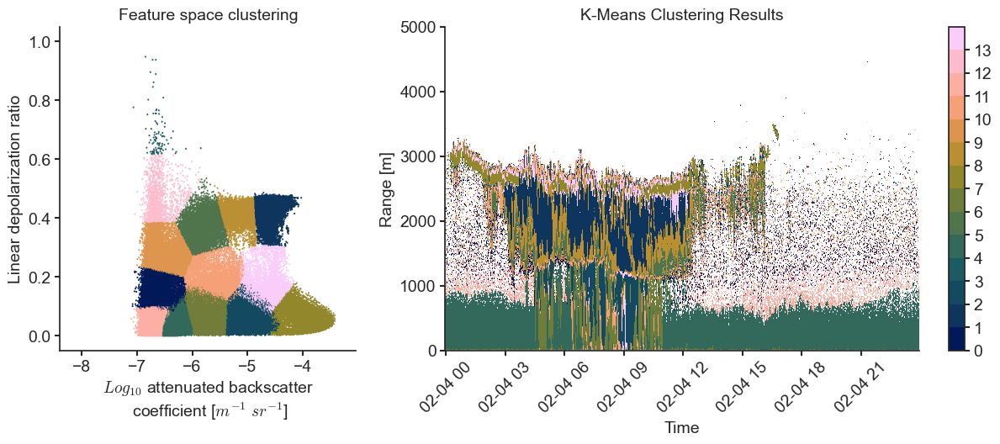

saving results under followingkmean_clusters


In [9]:
fig, axs = februar_04.classification.Kmeans_clustering(cluster_N=14, save_fig='Kmeans_Result_04022023_N14.jpg', plot_range=[0,5000])

# 1. Case study SION Feb 04:

In [7]:
februar_04 = mCL61.CL61Processor(folder_path='../Data_samples', specific_filename='cl61_20230204.nc')

- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False
load data from specific filne cl61_20230204.nc
Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !


Saving files into ../Outputs/Feb04


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to ../Outputs/Feb04\timeserie.jpg
Step 1: applying noise removal process
The results are stored under new variable: beta_att_clean, linear_depol_ratio_clean, noise mask and to_interpolate_mask
saved figure to ../Outputs/Feb04\denoised_timeserie.jpg


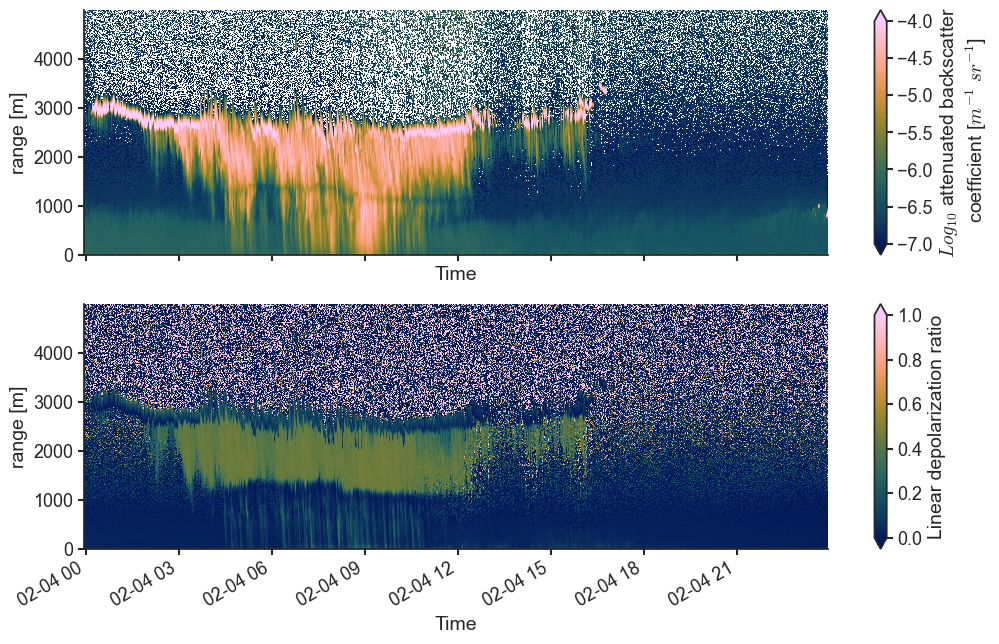

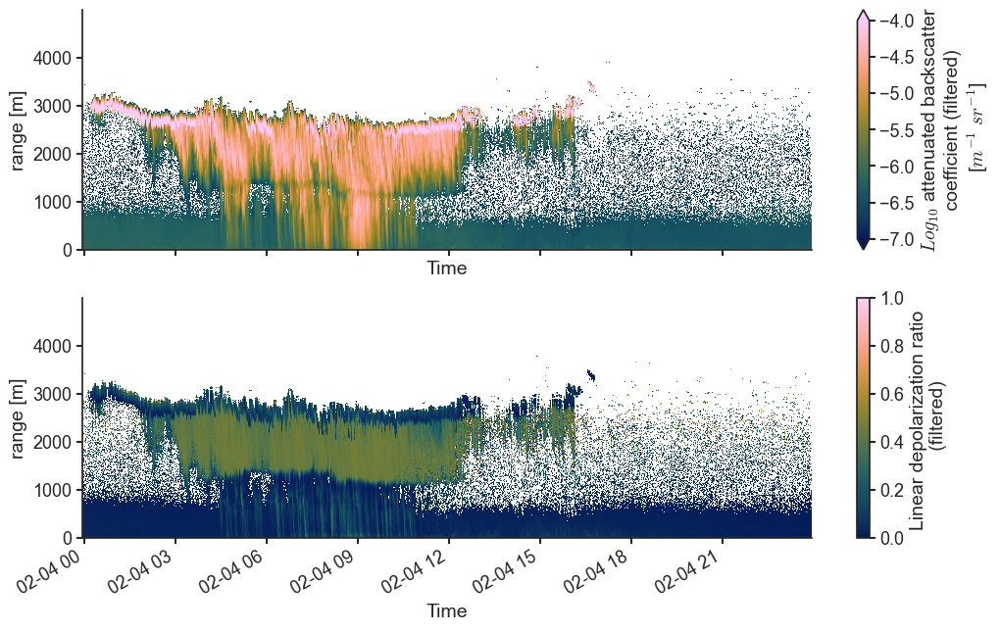

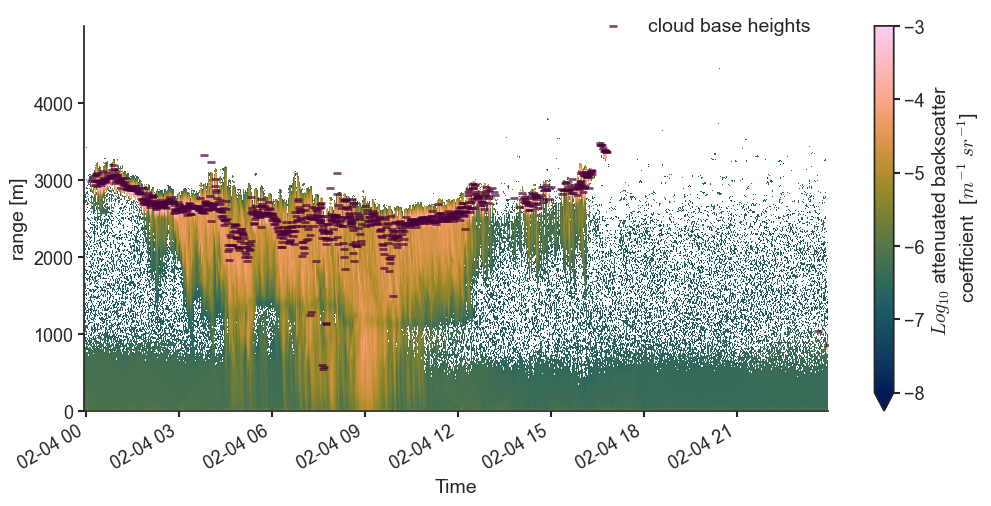

step 2: cluster data with kmean method
(4717440, 3)
Scaler means: [-5.78283455e+00  1.75196911e-01  1.31780207e+03]  
 and scales: [8.24022280e-01 1.74953662e-01 8.67763000e+02]


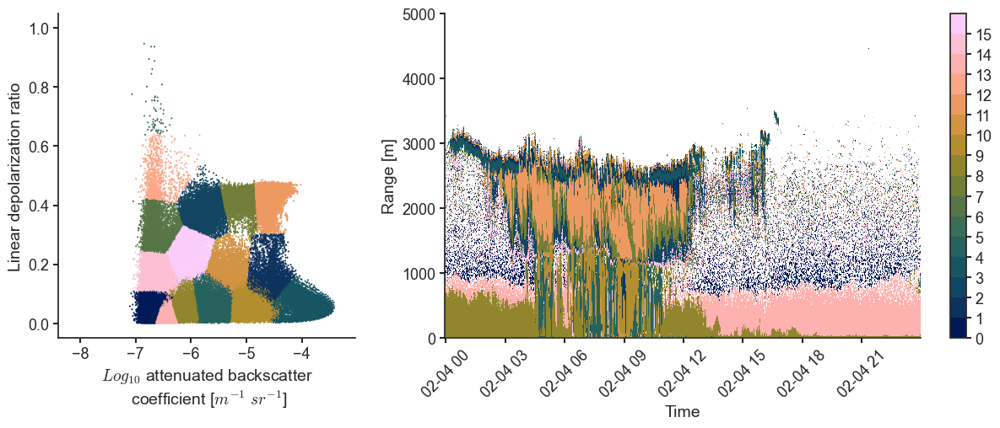

saving results under followingkmean_clusters
Classifying cluster from kmean_clusters
 Successful cluster classification stored in dataset under classified_clusters
Saved element to ../Outputs/Feb04\classified_clusters.jpg


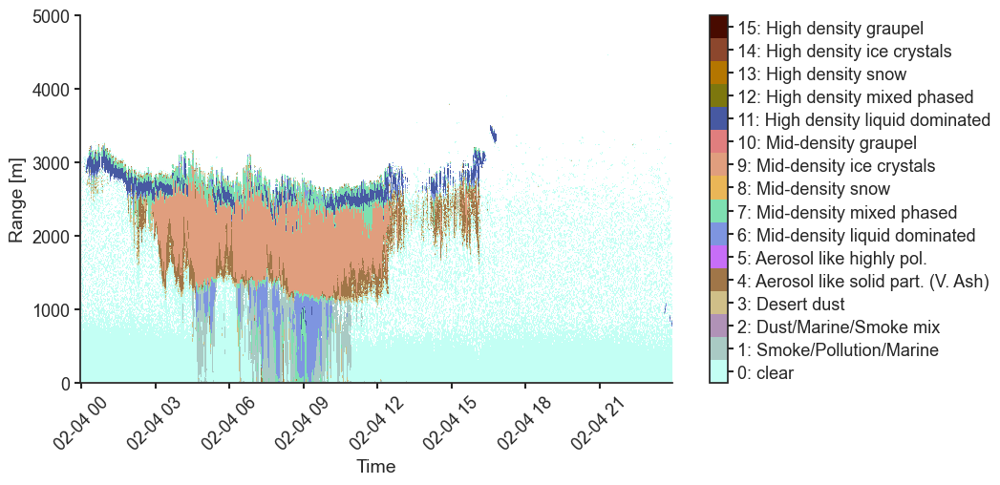

Step 3: Classify the elements and clusters based on the classification given in config file
Successful pixel-wise classification stored in dataset under classified_elements
Saved element to ../Outputs/Feb04\classified_elements.jpg


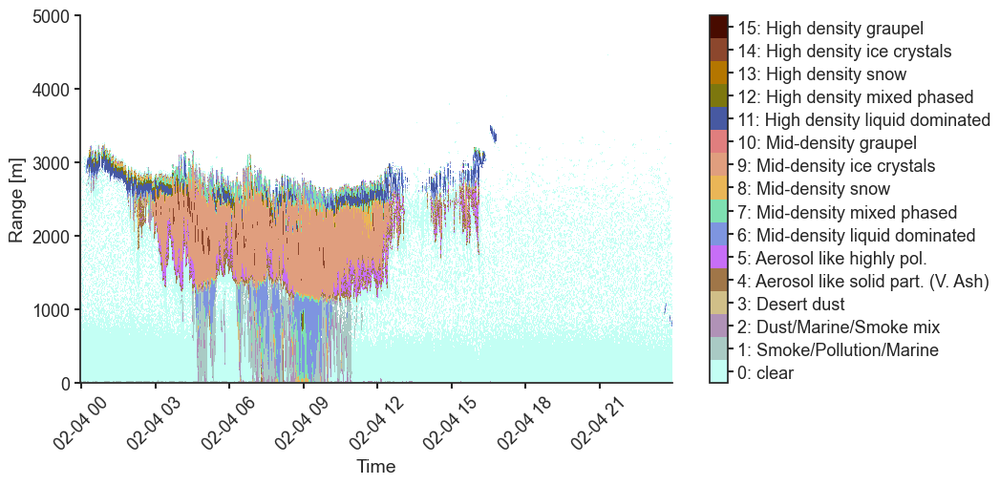

In [9]:
februar_04.auto_process(range_limits=[0,5000], save_into_folder="../Outputs/Feb04")

# 2. Case study Greenfjord

In [10]:
june28 = mCL61.CL61Processor(folder_path="../Data_samples/", specific_filename="cl61_20230628.nc")

- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False
load data from specific filne cl61_20230628.nc
Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !


Saving files into ../Outputs/Jun28


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to ../Outputs/Jun28\timeserie.jpg
Step 1: applying noise removal process
The results are stored under new variable: beta_att_clean, linear_depol_ratio_clean, noise mask and to_interpolate_mask
saved figure to ../Outputs/Jun28\denoised_timeserie.jpg


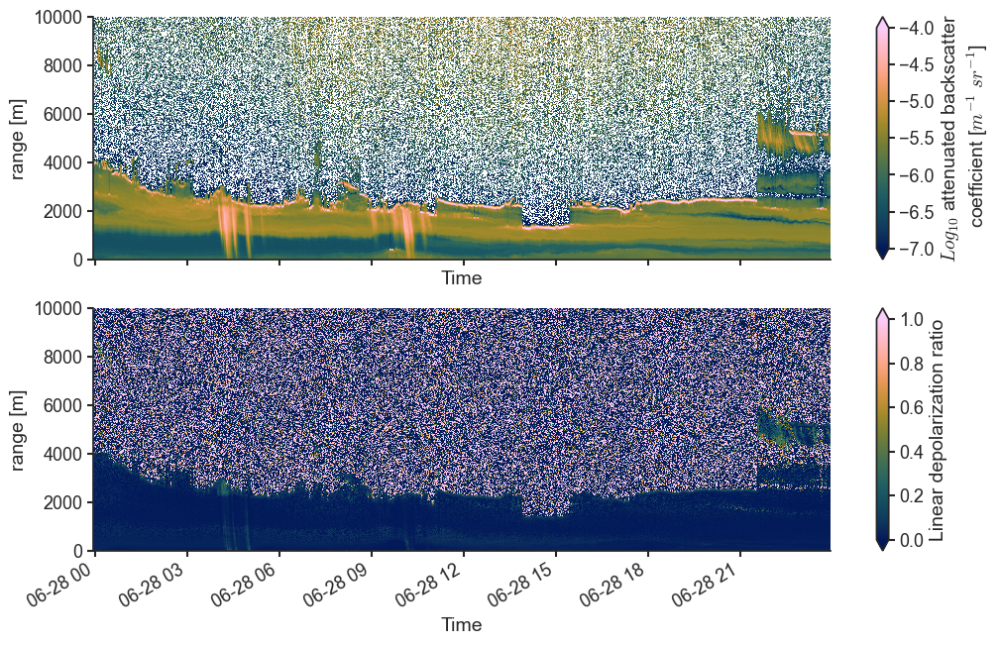

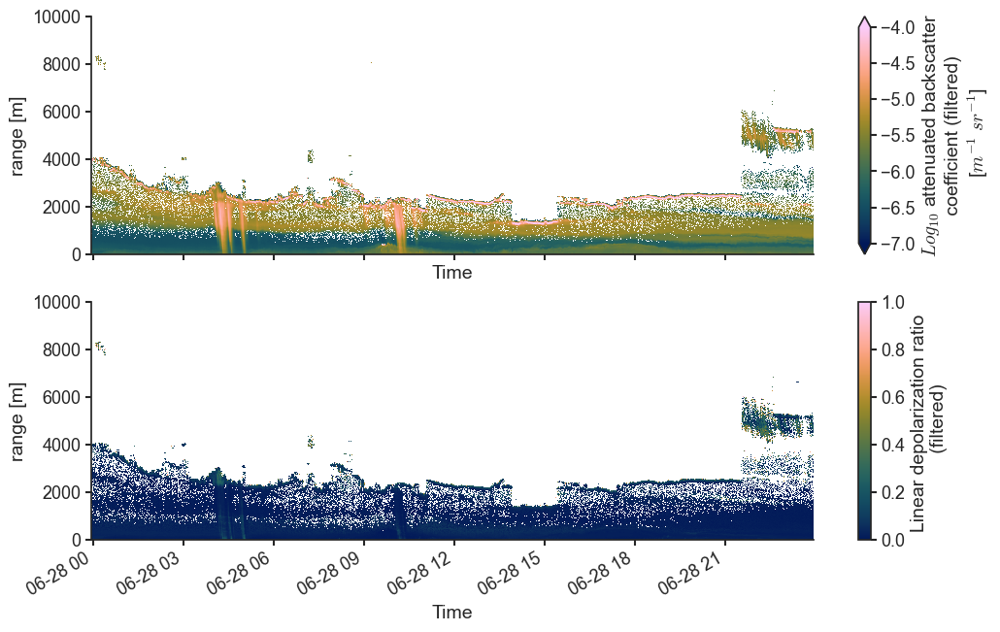

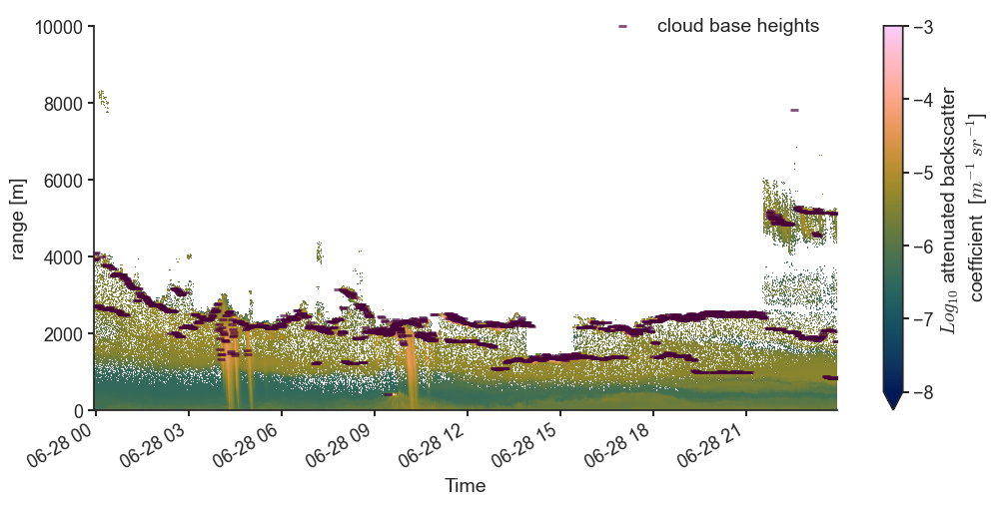

step 2: cluster data with kmean method
(4635540, 3)
Scaler means: [-5.64152437e+00  4.20340697e-02  1.36373752e+03]  
 and scales: [5.01994683e-01 7.62564553e-02 1.09187374e+03]


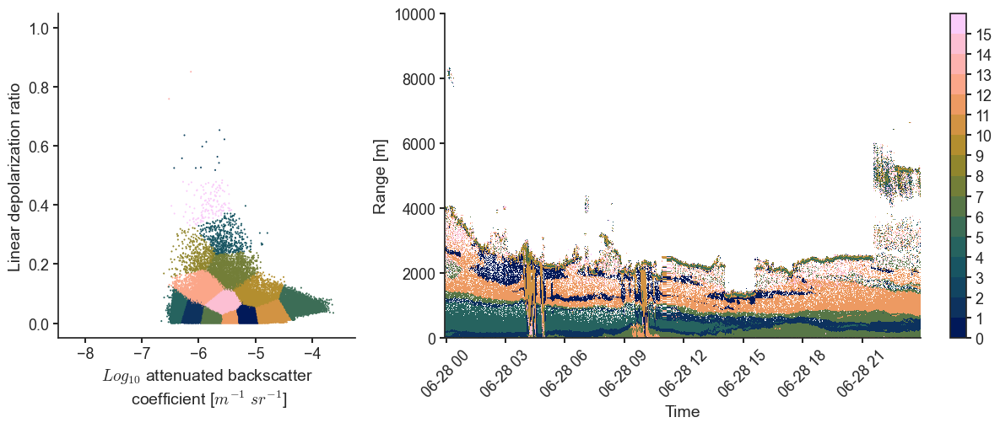

saving results under followingkmean_clusters
Classifying cluster from kmean_clusters
 Successful cluster classification stored in dataset under classified_clusters
Saved element to ../Outputs/Jun28\classified_clusters.jpg


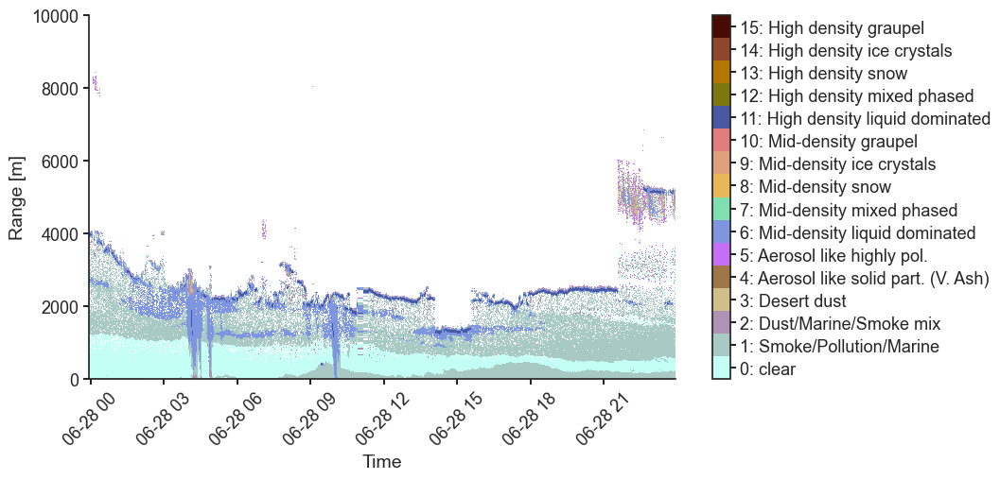

Step 3: Classify the elements and clusters based on the classification given in config file
Successful pixel-wise classification stored in dataset under classified_elements
Saved element to ../Outputs/Jun28\classified_elements.jpg


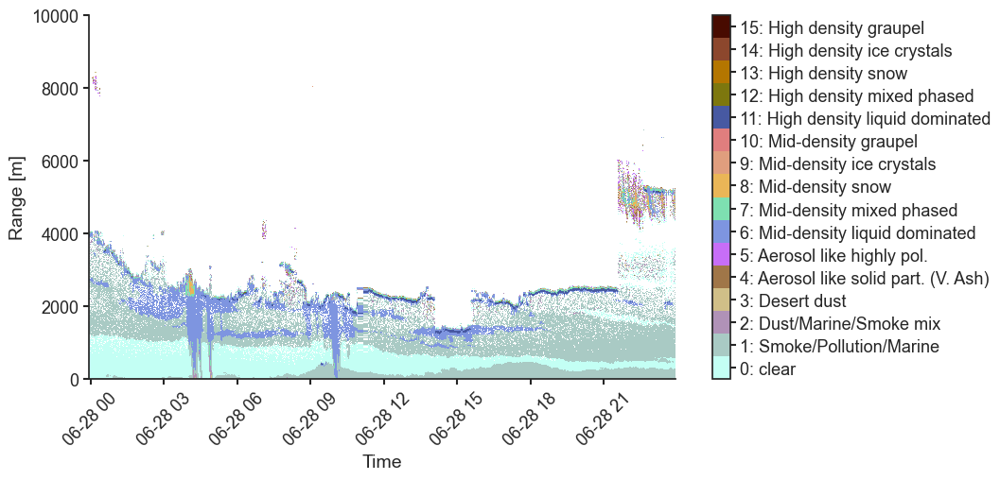

In [12]:
june28.auto_process(range_limits=[0,10000], save_into_folder="../Outputs/Jun28")

## Comparison to Hellikite measures

In [13]:
import pandas as pd
aerosol_file = "../Data_samples/Lv_0_Flight_4A_Aerosol.csv"
fc_st_file = "..\Data_samples\Lv_0_Flight_4A_FC_ST_STP_corr.csv"
df_aerosol = pd.read_csv(aerosol_file)
df_fc_st = pd.read_csv(fc_st_file)

df_aerosol['DateTime'] = pd.to_datetime(df_aerosol['DateTime'])
df_fc_st['DateTime_corr_unix'] = pd.to_datetime(df_fc_st['DateTime_corr_unix'])

C:\Users\gezas\AppData\Local\Temp\ipykernel_22296\1517890243.py:8: UserWarning: Parsing dates in %d/%m/%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_fc_st['DateTime_corr_unix'] = pd.to_datetime(df_fc_st['DateTime_corr_unix'])


In [14]:
df_aerosol.head()

,DateTime,datetimes,sample_flow_l_min,sample_press_mbar,sample_temp_C,sigmab_smth,sigmag_smth,sigmar_smth,DateTime.1,Status,...,Bin_Conc33,Bin_Conc34,Bin_Conc35,Bin_Conc36,Bin_Conc37,Bin_Conc38,Bin_Conc39,Bin_Conc40,totalconc,Altitude_hypso
0,2023-06-28 07:37:00,3770782620,0.97,1000,14.6,5.375410,4.550497,3.213707,1.687938e+09,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
1,2023-06-28 07:37:01,3770782621,0.99,999,14.6,5.593356,4.685771,3.482973,1.687938e+09,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
2,2023-06-28 07:37:02,3770782622,1.04,999,14.5,5.624212,4.807650,3.563493,1.687938e+09,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.005669
3,2023-06-28 07:37:03,3770782623,0.96,1000,14.5,5.802501,4.876282,3.613314,1.687938e+09,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.005669
4,2023-06-28 07:37:04,3770782624,0.99,999,14.5,5.829835,5.064403,3.907074,1.687938e+09,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.196025


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


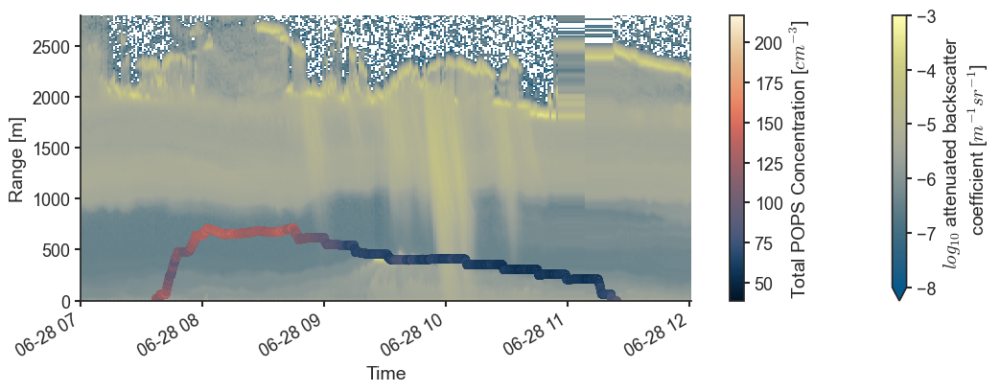

In [34]:
# Figure
fig, ax = plt.subplots(1, 1, figsize=(11, 4.2))

# Backscatter
arr = np.log10(june28.dataset['beta_att'].sel(range=slice(0, 2800), time=slice("2023-06-28 7:00", "2023-06-28 12:00")))
arr.attrs['long_name'] = 'log10 attenuated volume backscatter coefficient'
im = arr.plot.pcolormesh(x='time', y = 'range', vmin = -8, vmax = -3, cmap = 'cmc.nuuk')

cbar = im.colorbar
cbar.set_label("$log_{10}$ attenuated backscatter \n coefficient [$m^{-1}sr^{-1}$]")

# Aerosol concentration
scatter=ax.scatter(df_aerosol['DateTime'], df_aerosol['Altitude_hypso'], c=df_aerosol['total_POPS_conc'], cmap = 'cmc.lipari')

# Labels
ax.set_xlabel('Time')
ax.set_ylabel('Range [m]')
ax.set_title("")

# Add colorbar for the scatter plot
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Total POPS Concentration [$cm^{-3}$]')

plt.tight_layout()

plt.savefig('TotalPOPSConc.jpg', dpi = 400)

plt.show()

In [142]:
df_aerosol.columns

Index(['DateTime', 'datetimes', 'sample_flow_l_min', 'sample_press_mbar',
       'sample_temp_C', 'sigmab_smth', 'sigmag_smth', 'sigmar_smth',
       'DateTime.1', ' Status', ' PartCt', ' PartCon', ' BL', ' BLTH', ' STD',
       ' P', ' TofP', ' POPS_Flow', ' PumpFB', ' LDTemp', ' LaserFB',
       ' LD_Mon', ' Temp', ' BatV', ' Laser_Current', ' Flow_Set',
       'PumpLife_hrs', ' BL_Start', ' TH_Mult', ' nbins', ' logmin', ' logmax',
       ' Skip_Save', ' MinPeakPts', 'MaxPeakPts', ' RawPts', 'b0', 'b1', 'b2',
       'b3', 'b4', 'b5', 'b6', 'b7', 'b8', 'b9', 'b10', 'b11', 'b12', 'b13',
       'b14', 'b15', 'converted_datetime', 'total_POPS_conc', 'Bin_Conc1',
       'Bin_Conc2', 'Bin_Conc3', 'Bin_Conc4', 'Bin_Conc5', 'Bin_Conc6',
       'Bin_Conc7', 'Bin_Conc8', 'Bin_Conc9', 'Bin_Conc10', 'Bin_Conc11',
       'Bin_Conc12', 'Bin_Conc13', 'Bin_Conc14', 'Bin_Conc15', 'Bin_Conc16',
       'Bin_Conc17', 'Bin_Conc18', 'Bin_Conc19', 'Bin_Conc20', 'Bin_Conc21',
       'Bin_Conc22', 'Bin_Conc

c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


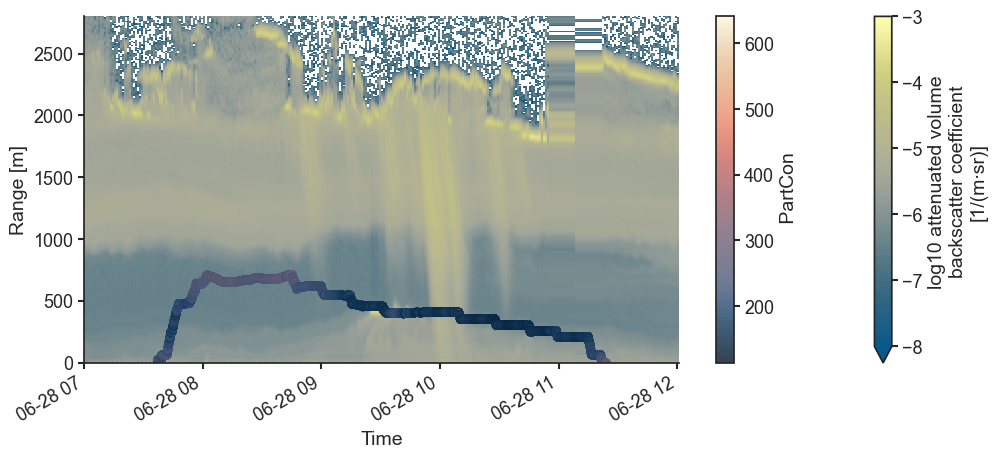

In [26]:
# Figure
fig, ax = plt.subplots(1, 1, figsize=(12, 4.5))

# Backscatter
arr = np.log10(june28.dataset['beta_att'].sel(range=slice(0, 2800), time=slice("2023-06-28 7:00", "2023-06-28 12:00")))
arr.attrs['long_name'] = 'log10 attenuated volume backscatter coefficient'
im = arr.plot.pcolormesh(x='time', y = 'range', vmin = -8, vmax = -3, cmap = 'cmc.nuuk')

# Aerosol concentration
scatter=ax.scatter(df_aerosol['DateTime'], df_aerosol['Altitude_hypso'], c=df_aerosol[' PartCon'], cmap = 'cmc.lipari', alpha = 0.8)

# Labels
ax.set_xlabel('Time')
ax.set_ylabel('Range [m]')
ax.set_title("")

# Add colorbar for the scatter plot
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label(' PartCon')

plt.show()

In [22]:
df_fc_st.columns

Index(['Unnamed: 0', 'DateTime_corr_unix', 'SBI', 'DateTime', 'PartCon', 'CO2',
       'P_baro', 'TEMPbox', 'mFlow', 'TEMPsamp', 'RHsamp', 'TEMP1', 'RH1',
       'TEMP2', 'RH2', 'vBat', 'Pref', 'Altitude_hypso', 'Time_ST',
       'Module ID_ST', 'Alt (m)_ST', 'P (mbar)_ST', 'T (deg C)_ST', '%RH_ST',
       'Wind (degrees)_ST', 'Wind (m/s)_ST', 'Supply (V)_ST', 'UTC Time_ST',
       'Speed (m/s)_ST', 'Date_ST', 'CO2 moist'],
      dtype='object')

c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


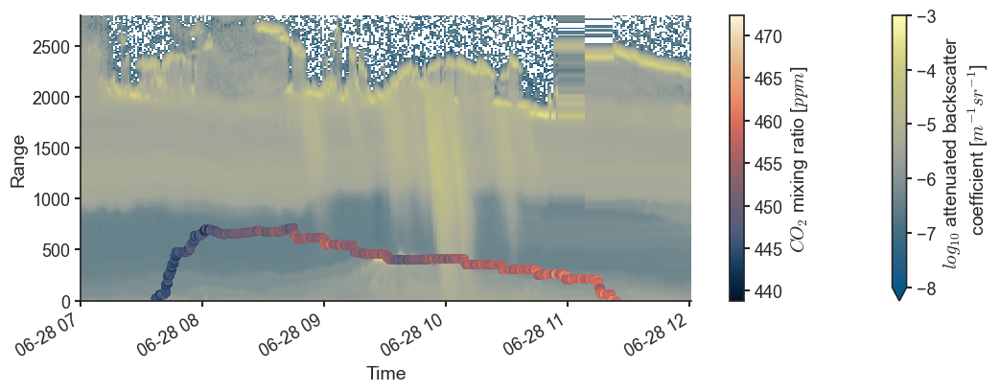

In [35]:
# Create a figure and axis
fig, ax = plt.subplots(1, 1, figsize=(11, 4.2))

# Backscatter
arr = np.log10(june28.dataset['beta_att'].sel(range=slice(0, 2800), time=slice("2023-06-28 7:00", "2023-06-28 12:00")))
arr.attrs['long_name'] = 'log10 attenuated volume backscatter coefficient'
im = arr.plot.pcolormesh(x='time', y = 'range', vmin = -8, vmax = -3, cmap = 'cmc.nuuk')

cbar = im.colorbar
cbar.set_label("$log_{10}$ attenuated backscatter \n coefficient [$m^{-1}sr^{-1}$]")

# Plot the second dataset (pandas)
scatter=ax.scatter(df_fc_st['DateTime_corr_unix'], df_fc_st['Altitude_hypso'], c=df_fc_st['CO2 moist'], cmap = 'cmc.lipari')

# Add labels, title, legend, etc. if needed
ax.set_xlabel('Time')
ax.set_ylabel('Range')
ax.set_title("")

# Add colorbar for the scatter plot
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('$CO_2$ mixing ratio [$ppm$]')

plt.tight_layout()

plt.savefig("CO2Conc.jpg", dpi = 400)


# 3) Saharan dust in Sion

In [13]:
folder_path = r"../CL61_module/temp"
start_dt = "2023-02-23 00:00"
end_dt = "2023-02-23 23:59"
feb23 = mCL61.CL61Processor(folder_path=folder_path, start_datetime=start_dt, end_datetime=end_dt)

- Getting filenames in data folder ... 
- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False


100%|██████████| 288/288 [00:27<00:00, 10.60it/s]

Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !


In [29]:
feb22 = mCL61.CL61Processor(folder_path='../Data_samples/', specific_filename='cl61_20230222.nc')

- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False
load data from specific filne cl61_20230222.nc
Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !


Saving files into ../Outputs/Feb22/


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to ../Outputs/Feb22/timeserie.jpg
Step 1: applying noise removal process
The results are stored under new variable: beta_att_clean, linear_depol_ratio_clean, noise mask and to_interpolate_mask
saved figure to ../Outputs/Feb22/denoised_timeserie.jpg


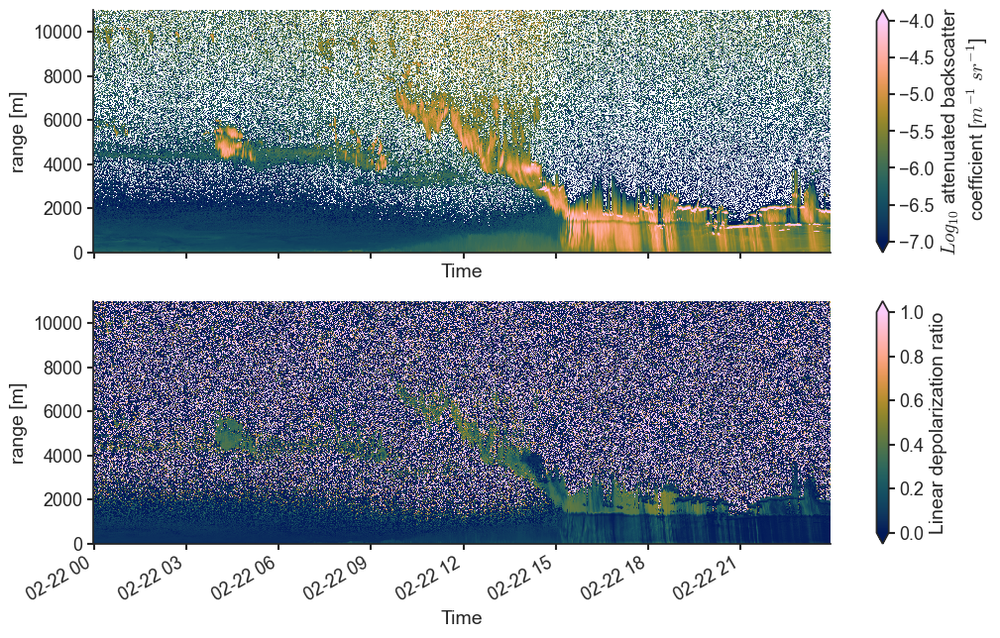

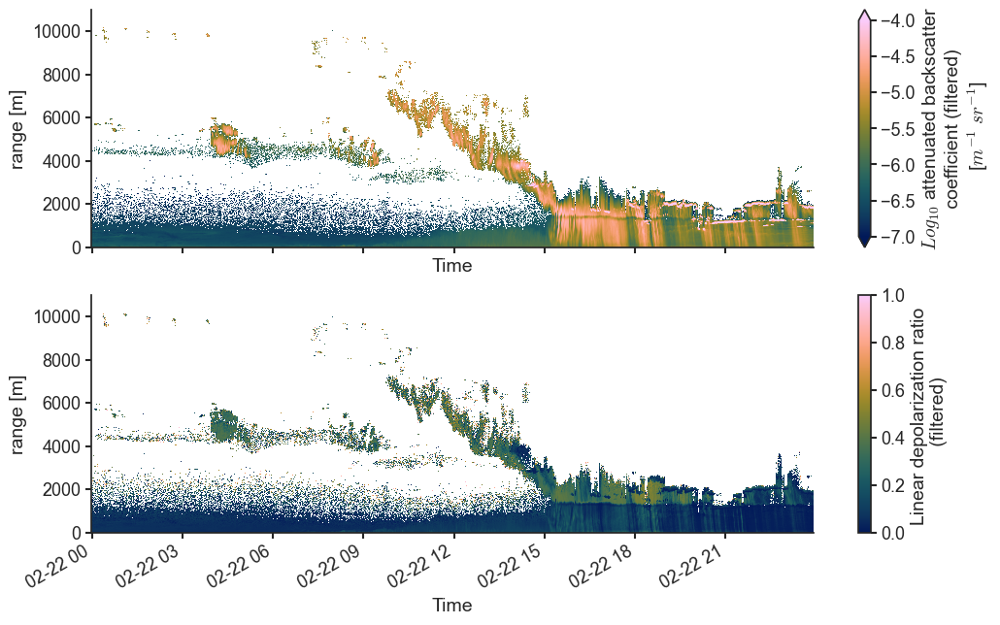

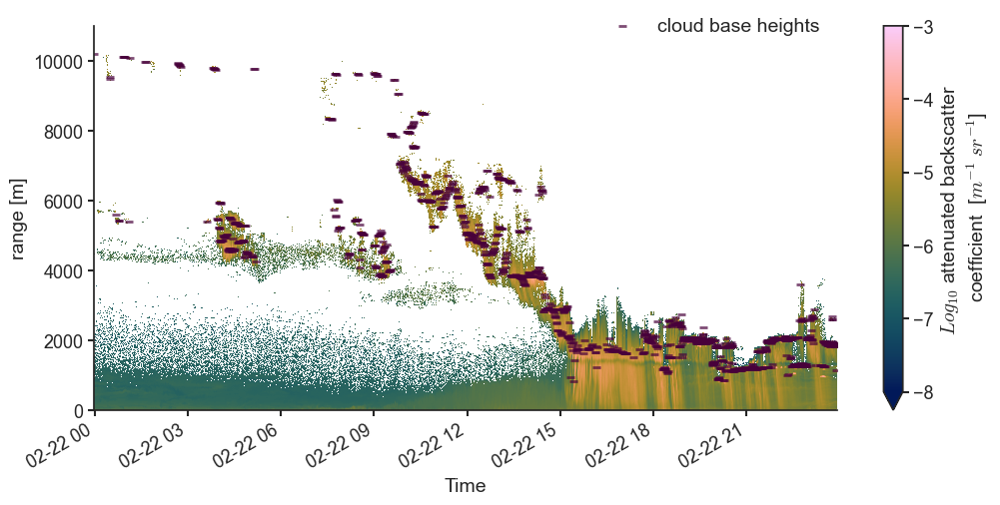

step 2: cluster data with kmean method
(4701060, 3)
Scaler means: [-5.83793593e+00  1.74732095e-01  1.80478805e+03]  
 and scales: [7.02716557e-01 1.70202953e-01 1.72734465e+03]


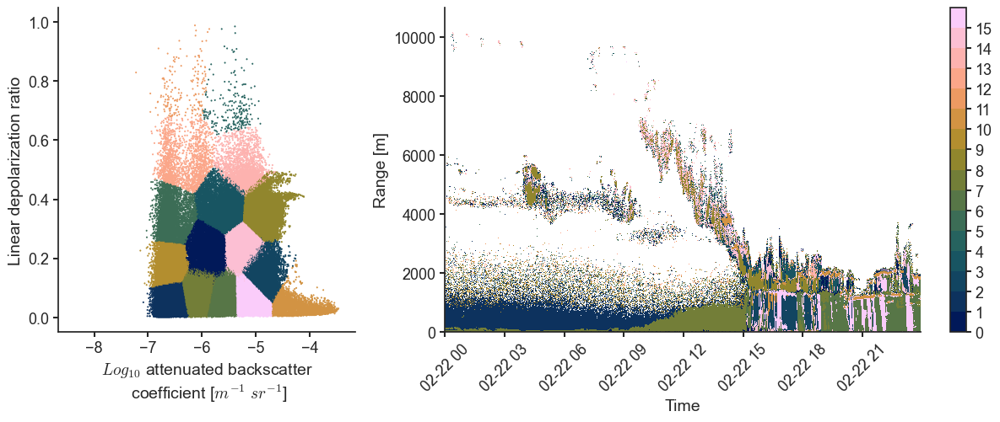

saving results under followingkmean_clusters
Classifying cluster from kmean_clusters
 Successful cluster classification stored in dataset under classified_clusters
Saved element to ../Outputs/Feb22/classified_clusters.jpg


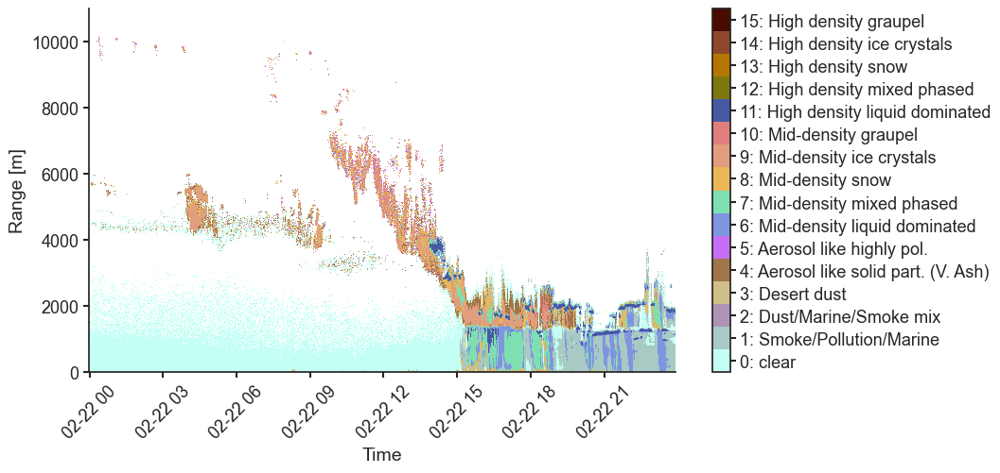

Step 3: Classify the elements and clusters based on the classification given in config file
Successful pixel-wise classification stored in dataset under classified_elements
Saved element to ../Outputs/Feb22/classified_elements.jpg


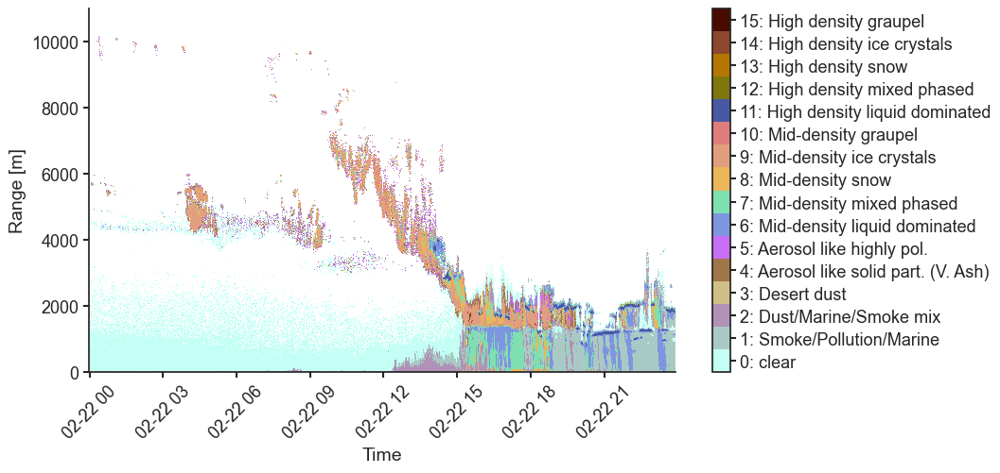

In [31]:
feb22.auto_process(range_limits = [0,11000], save_into_folder="../Outputs/Feb22/")

array([<Axes: xlabel='time', ylabel='range [m]'>,
       <Axes: xlabel='time', ylabel='range [m]'>], dtype=object)

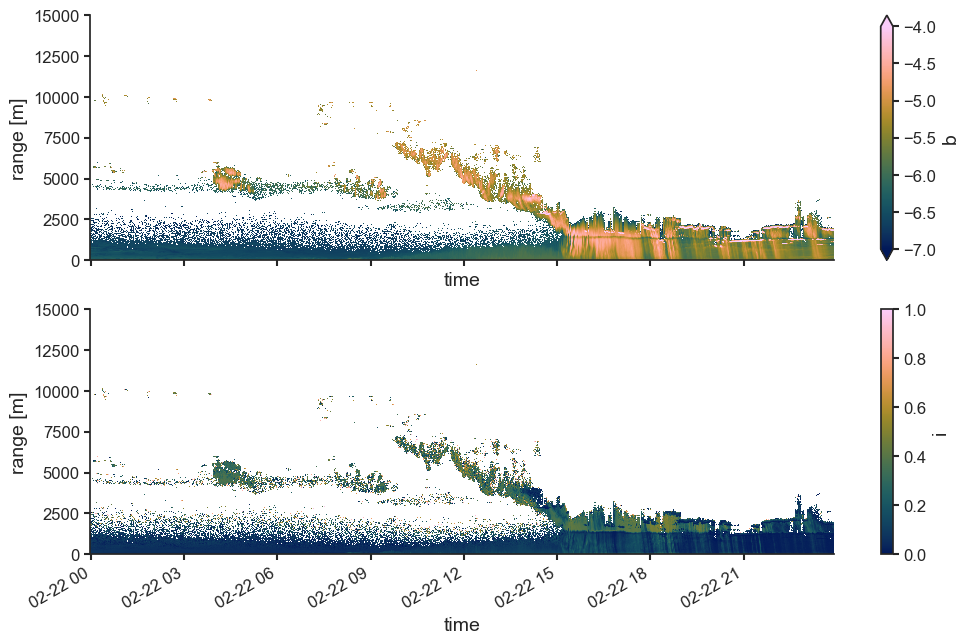

In [24]:
feb22.plot.show_timeserie(variable_names=['beta_att_clean', 'linear_depol_ratio_clean'])

In [20]:
feb23 = mCL61.CL61Processor(folder_path='../Data_samples/', specific_filename='cl61_20230223.nc')

- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False
load data from specific filne cl61_20230223.nc
Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !


Saving files into ../Outputs/Feb23/


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to ../Outputs/Feb23/timeserie.jpg
Step 1: applying noise removal process
The results are stored under new variable: beta_att_clean, linear_depol_ratio_clean, noise mask and to_interpolate_mask
saved figure to ../Outputs/Feb23/denoised_timeserie.jpg


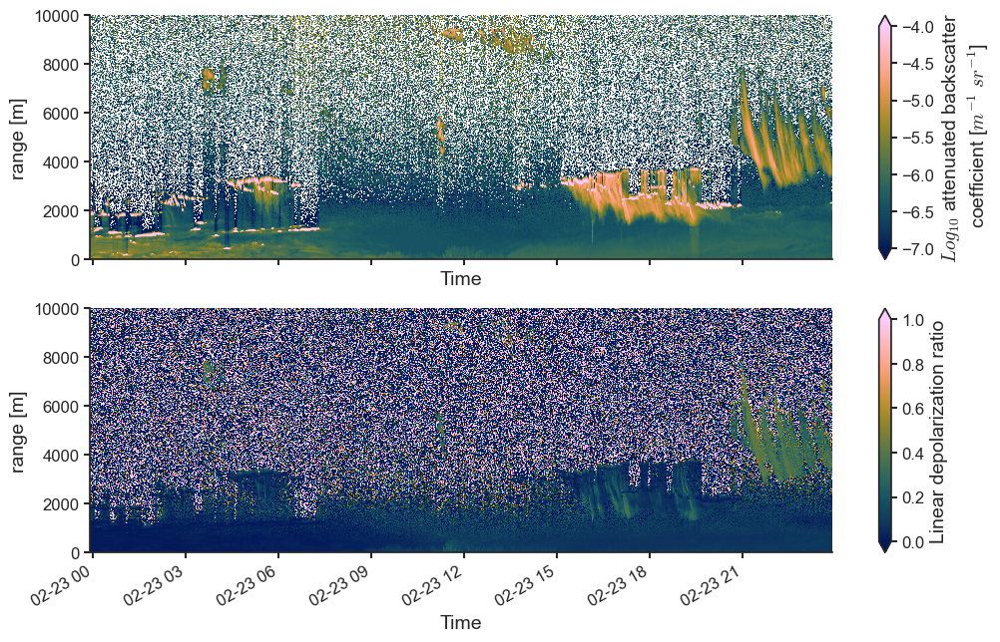

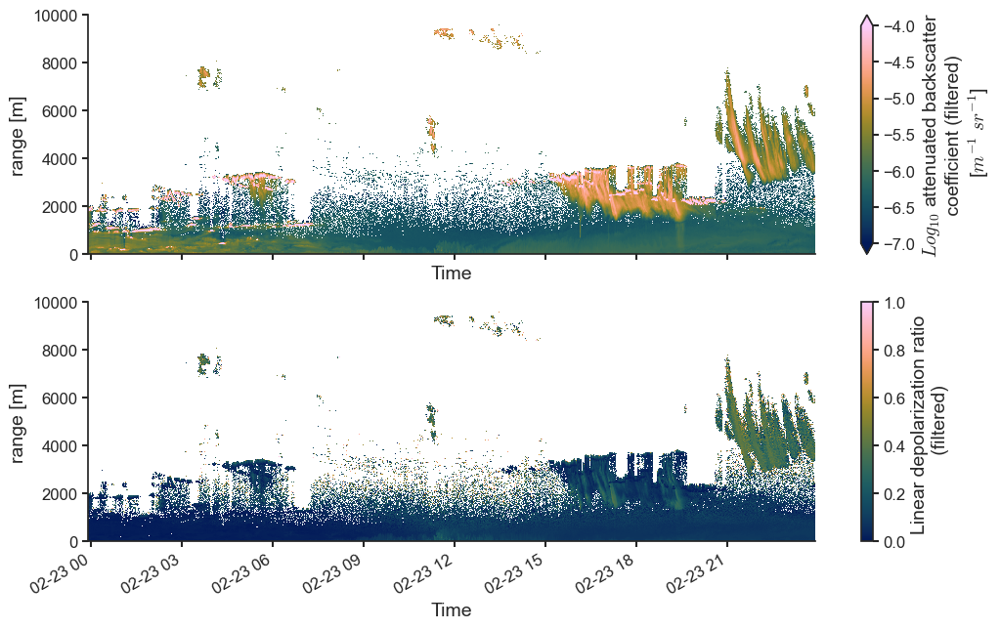

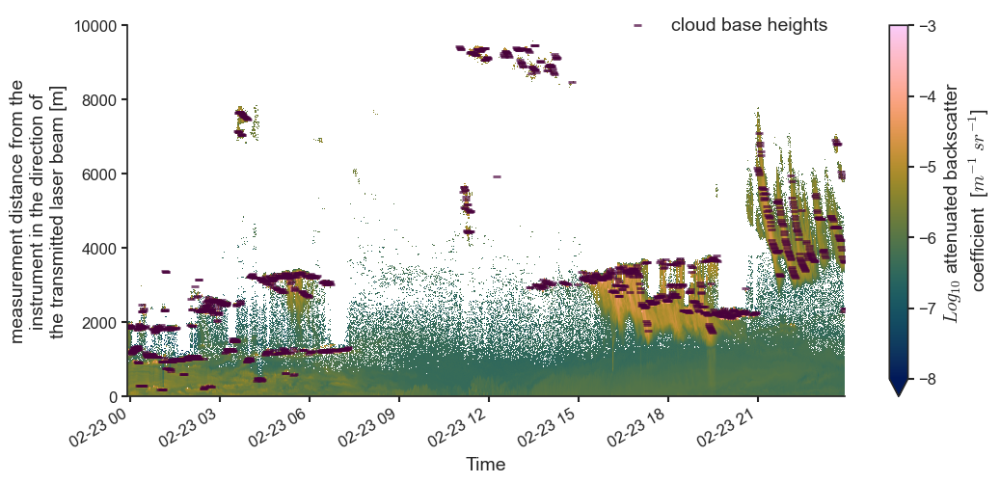

step 2: cluster data with kmean method
(4717440, 3)
Scaler means: [-5.94675093e+00  1.39367878e-01  1.80931590e+03]  
 and scales: [5.84512327e-01 1.48081137e-01 1.54700708e+03]


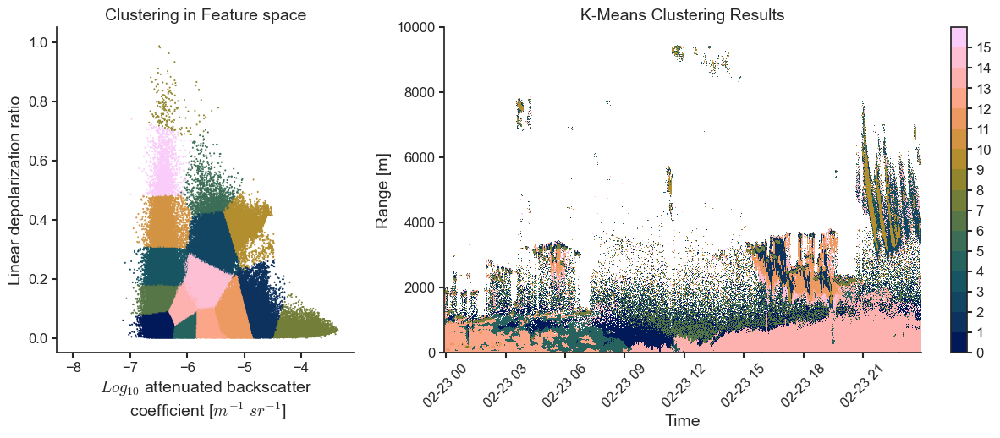

saving results under followingkmean_clusters
Classifying cluster from kmean_clusters
 Successful cluster classification stored in dataset under classified_clusters
Saved element to ../Outputs/Feb23/classified_clusters.jpg


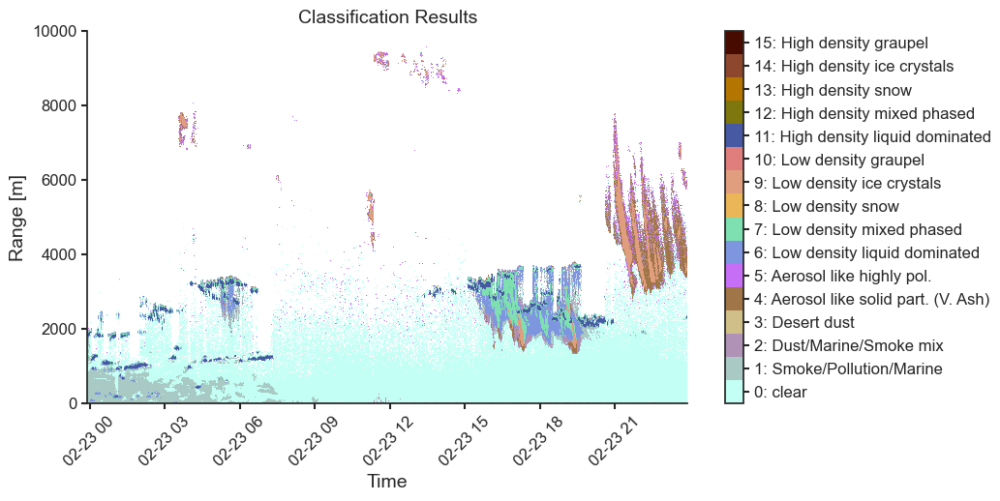

Step 3: Classify the elements and clusters based on the classification given in config file
Successful pixel-wise classification stored in dataset under classified_elements
Saved element to ../Outputs/Feb23/classified_elements.jpg


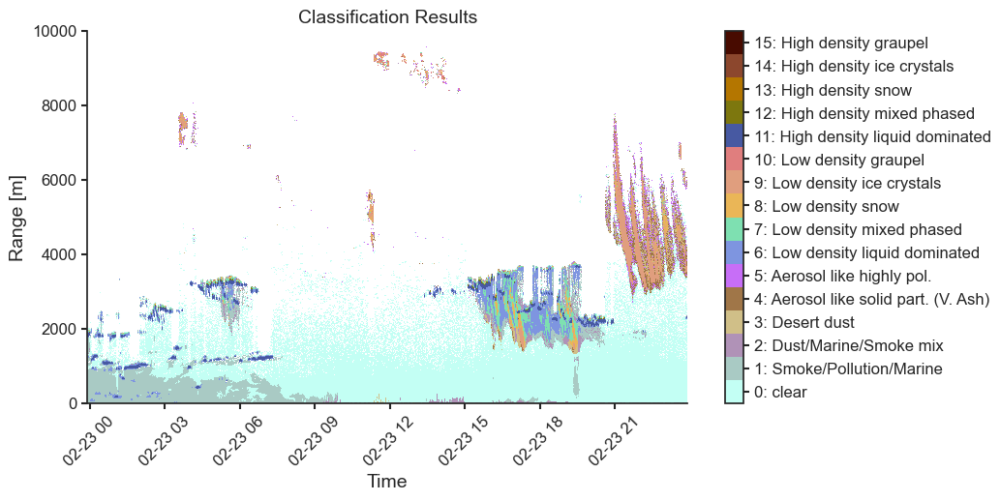

In [22]:
feb23.auto_process(range_limits = [0,10000], save_into_folder="../Outputs/Feb23/")

In [ ]:
def classify_elementwise(self,
                            beta_attenuation_varname='beta_att_clean',
                            linear_depol_ratio_varname = 'linear_depol_ratio_clean'):
    '''
    Classifies directly element wise based on thresholds focused on the variables in question
    '''

    # get directly the arrays to classifiy
    beta_attenuation_array = self.dataset[beta_attenuation_varname]
    lin_depol_array = self.dataset[linear_depol_ratio_varname]
    
    # New array for cluster results
    classified_result_label = xr.full_like(beta_attenuation_array, np.nan)

    # Classify based on ranges as defined in config file
    for category in self.config['classes']:
        beta_range = category['beta_attenuation_range']
        depolarization_range = category['linear_depolarisation_ratio_range']
        cluster_id = category['class_id']

        mask_beta_att = (beta_range[0] <= beta_attenuation_array) & (beta_attenuation_array <= beta_range[1])
        mask_ldr = (depolarization_range[0] <= lin_depol_array) & (lin_depol_array <= depolarization_range[1])
        common_mask = mask_beta_att & mask_ldr
        classified_result_label = xr.where(common_mask, cluster_id, classified_result_label)

    new_var_name = 'classified_elements'
    self.dataset[new_var_name] = classified_result_label

    self.dataset[new_var_name].attrs['name'] = 'point-wise classification'
    print(f"Successful pixel-wise classification stored in dataset under {new_var_name}")
    return

In [15]:
test_cbh = februar_04.dataset['cloud_base_heights'].expand_dims("range")

In [16]:
test_cbh

<xarray.DataArray 'cloud_base_heights' (range: 1, time: 1440, layer: 5)>
array([[[ nan,  nan,  nan,  nan,  nan],
        [ nan,  nan,  nan,  nan,  nan],
        [ nan,  nan,  nan,  nan,  nan],
        ...,
        [ nan,  nan,  nan,  nan,  nan],
        [ nan,  nan,  nan,  nan,  nan],
        [854.,  nan,  nan,  nan,  nan]]])
Coordinates:
  * time       (time) datetime64[ns] 2023-02-03T23:57:10.712999936 ... 2023-0...
  * layer      (layer) float64 1.0 2.0 3.0 4.0 5.0
    longitude  float64 7.361
    latitude   float64 46.22
Dimensions without coordinates: range
Attributes:
    units:      m
    long_name:  heights (range) of the detected cloud bases

In [ ]:
def classify_cloud_base_heights(dataset, config, classification):
    
    for category in config['classes']:
        beta_range = category['beta_attenuation_range']
        depolarization_range = category['linear_depolarisation_ratio_range']